# Applied ML Project (Optiver) - Image-based Approach + SARIMA
# Model Training

In [1]:
# Import libraries
import os
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import img_to_array
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import tensorflow as tf

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())
tf.config.set_visible_devices([], 'GPU')

# # Set GPU memory growth to avoid memory allocation issues
# physical_devices = tf.config.list_physical_devices('GPU')
# for device in physical_devices:
#     tf.config.experimental.set_memory_growth(device, True)

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 12591224526878203936
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
locality {
  bus_id: 1
}
incarnation: 8216618143862327678
physical_device_desc: "device: 0, name: METAL, pci bus id: <undefined>"
xla_global_id: -1
]
Metal device set to: Apple M2 Pro

systemMemory: 32.00 GB
maxCacheSize: 10.67 GB



In [3]:
def load_img_data(data_folder_name):
    # List to store image paths and corresponding labels
    data = []
    labels = []

    current_filepath = os.getcwd()
    data_filepath = f"{current_filepath}/{data_folder_name}/"
    i=0

    # Ensure it's a directory
    if os.path.isdir(data_filepath):
        for image_filename in os.listdir(data_filepath):
            if ".png" in image_filename:
                image_path = os.path.join(data_filepath, image_filename)
                print(f"Loading {image_path}")
                i+=1
                
                # Extracting the label (float) from the filename 
                label = float(os.path.splitext(image_filename)[0].split('_')[2]) 
                print(f"Label: {label}")
                
                # Loading image as grayscale
                img = Image.open(image_path).convert('L')
                img_array = img_to_array(img)
                
                # Appending image array and label to the data lists
                data.append(img_array)
                labels.append(label) 
    
    return np.array(data), np.array(labels)

In [4]:
# # List to store image paths and corresponding labels
# data = []
# labels = []

# current_filepath = os.getcwd()
# data_filepath = f"{current_filepath}/image_data/"
# i=0

# # Ensure it's a directory
# if os.path.isdir(data_filepath):
#     for image_filename in os.listdir(data_filepath):
#         if ".png" in image_filename:
#             image_path = os.path.join(data_filepath, image_filename)
#             print(image_path)
#             i+=1
#             print(i)
#             # Extract the label from the filename (assuming it's a float)
#             label = float(os.path.splitext(image_filename)[0].split('_')[2])  # Adjust this based on your filename structure
#             print(label)
            
#             # Load image and convert to array
#             img = Image.open(image_path).convert('L') # load as grayscale
#             img_array = img_to_array(img)
            
#             # Append image array and label to the data lists
#             data.append(img_array)
#             labels.append(label)  # Assuming class folders are named with integer labels

# # Convert lists to numpy arrays
# data = np.array(data)
# labels = np.array(labels)

train_data_folder = "image_data"
X_train, y_train = load_img_data(train_data_folder)
test_data_folder = "test_image_data"
X_test, y_test = load_img_data(test_data_folder)

# Normalizing training data (from 0 to 1)
max_pixel = X_train.max()
X_train = X_train.astype('float32') / max_pixel
max_pixel = X_test.max()
X_test = X_test.astype('float32') / max_pixel

# Split the data into training and test sets
# X_train, X_test, y_train, y_test = train_test_split(data_norm, labels, test_size=0.2, random_state=42)

Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/172_309_11.069775.png
Label: 11.069775
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/114_8_-21.8302.png
Label: -21.8302
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/68_369_-1.7899275.png
Label: -1.7899275
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/96_344_-13.939738.png
Label: -13.939738
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/96_36_-1.0800362.png
Label: -1.0800362
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/51_308_-0.6198883.png
Label: -0.6198883
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/162_397_-6.4200163.png
Label: -6.4200163
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/33_28_1.72019.png
Label: 1.72019
Loading /Users/akprabhu/Developer/AAI 695 - Applied ML/optiver/image_data/166_250_-4.310012.png
Label

In [15]:
# Define the CNN model
model = Sequential()

# Convolutional layers 
model.add(Conv2D(16, (3, 3), activation='relu', input_shape=(369, 496, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten layer
model.add(Flatten())

# Dense layers
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))  # Linear activation for regression

# Compile the model
model.compile(optimizer='adam', loss='mean_absolute_error')  # Adjust the loss function based on your task

# Display the model summary
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 367, 494, 16)      160       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 183, 247, 16)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 181, 245, 32)      4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 90, 122, 32)      0         
 2D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 351360)            0         
                                                                 
 dense_6 (Dense)             (None, 128)              

In [16]:
model.fit(X_train, y_train, epochs=8, batch_size=256, validation_split=0.2)
mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {mae}")

Epoch 1/8


279/279 [==============================] - 1431s 5s/step - loss: 7.3788 - val_loss: 6.7409
Epoch 2/8
279/279 [==============================] - 1390s 5s/step - loss: 6.6998 - val_loss: 6.7317
Epoch 3/8
279/279 [==============================] - 1389s 5s/step - loss: 6.6547 - val_loss: 6.7303
Epoch 4/8
279/279 [==============================] - 1389s 5s/step - loss: 6.6094 - val_loss: 6.7583
Epoch 5/8
279/279 [==============================] - 1392s 5s/step - loss: 6.5438 - val_loss: 6.7579
Epoch 6/8
279/279 [==============================] - 1395s 5s/step - loss: 6.4601 - val_loss: 6.8048
Epoch 7/8
279/279 [==============================] - 1402s 5s/step - loss: 6.3671 - val_loss: 6.8043
Epoch 8/8
188/188 [==============================] - 23s 121ms/step - loss: 5.7135
Test Loss: 5.713507175445557


In [17]:
model.save('model_epoch8_batchsize128_val20_images89K.h5')
# model_epoch10_batchsize32_val20_images33K: mse was 46.27

In [18]:
# Get predictions on the test set
predictions = model.predict(X_test)

188/188 [==============================] - 23s 120ms/step


In [19]:
# Display actual vs predicted values
for actual, predicted in zip(y_test[:100], predictions[:100]):
    actual_value = actual if np.isscalar(actual) else actual[0]
    predicted_value = predicted[0]
    print(f"Actual: {actual_value}, Predicted: {predicted_value}")

Actual: 3.5095215, Predicted: 1.7058775424957275
Actual: 6.7794323, Predicted: -0.9292669296264648
Actual: 2.8800964, Predicted: 1.1129200458526611
Actual: 19.819736, Predicted: -0.10379792749881744
Actual: -17.020107, Predicted: -2.078091859817505
Actual: 2.9194355, Predicted: -1.282033085823059
Actual: 5.890131, Predicted: -0.2587001919746399
Actual: -0.2002716, Predicted: -1.298093557357788
Actual: 0.48995018, Predicted: 2.2341489791870117
Actual: 3.7002563, Predicted: -0.4978671371936798
Actual: -2.3698807, Predicted: -1.082006812095642
Actual: -0.6401539, Predicted: -1.2789008617401123
Actual: -2.9700994, Predicted: -2.8443164825439453
Actual: 5.1903725, Predicted: -0.11509005725383759
Actual: -4.479885, Predicted: 0.004742219112813473
Actual: -11.9102, Predicted: -5.468677043914795
Actual: -0.28014183, Predicted: -3.2637178897857666
Actual: 0.269413, Predicted: 0.26085716485977173
Actual: -9.009838, Predicted: -1.465731143951416
Actual: 4.2796135, Predicted: -2.494673252105713
Ac

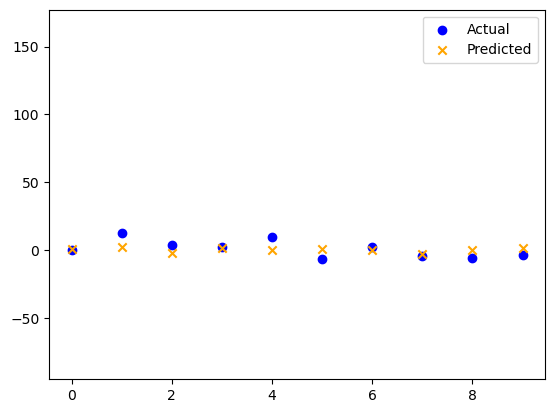

In [20]:
import matplotlib.pyplot as plt

numpoints = 10
t = np.arange(0, y_test[:numpoints].shape[0])
random_indices = np.random.choice(len(y_test), size=numpoints, replace=False)
plt.scatter(t, y_test[random_indices], label='Actual', color='blue', marker='o')
plt.scatter(t, predictions[random_indices], label='Predicted', color='orange', marker='x')
plt.ylim(y_test.min(), y_test.max())
plt.legend()